<a href="https://colab.research.google.com/github/duonghung86/Vehicle-trajectory-tracking/blob/master/VTP_0_Data_exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Load a dataset from US-101 datasets 

In [17]:
from io import StringIO
from io import BytesIO
from zipfile import ZipFile
import urllib.request

def zip2df(link):
    # Open the url link
    url = urllib.request.urlopen(link)
    
    # Open as zip file
    with ZipFile(BytesIO(url.read())) as my_zip_file:
        for contained_file in my_zip_file.namelist():
            fzip=my_zip_file.open(contained_file)
            print(contained_file)
            data=fzip.read()
    # Convert bytes object to string object
    s=str(data,'utf-8')
    data = StringIO(s) 
    # convert it to pandas DataFrame as normal csv file
    df=pd.read_csv(data)
    return df

In [18]:
link_0750 = 'https://github.com/duonghung86/Vehicle-trajectory-tracking/raw/master/Data/NGSIM/US-101-LosAngeles-CA/vehicle-trajectory-data/0750_0805_us101_smoothed_11_.zip'

df=zip2df(link_0750)
df.info()
df.head()

0750_0805_us101_smoothed_11_.csv
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 18 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   Vehicle_ID    1048575 non-null  int64  
 1   Frame_ID      1048575 non-null  int64  
 2   Total_Frames  1048575 non-null  int64  
 3   Global_Time   1048575 non-null  int64  
 4   Local_X       1048575 non-null  float64
 5   Local_Y       1048575 non-null  float64
 6   Global_X      1048575 non-null  float64
 7   Global_Y      1048575 non-null  float64
 8   v_Length      1048575 non-null  float64
 9   v_Width       1048575 non-null  float64
 10  v_Class       1048575 non-null  int64  
 11  v_Vel         1048575 non-null  float64
 12  v_Acc         1048575 non-null  float64
 13  Lane_ID       1048575 non-null  int64  
 14  Preceeding    1048575 non-null  int64  
 15  Following     1048575 non-null  int64  
 16  Space_Hdwy    1048575 non-null  float64

,Vehicle_ID,Frame_ID,Total_Frames,Global_Time,Local_X,Local_Y,Global_X,Global_Y,v_Length,v_Width,v_Class,v_Vel,v_Acc,Lane_ID,Preceeding,Following,Space_Hdwy,Time_Hdwy
0,2,13,437,1118846980200,16.467196,35.380427,6451137.641,1873344.962,14.5,4.9,2,40.000000,0.000000,2,0,0,0.0,0.0
1,2,14,437,1118846980300,16.446594,39.381608,6451140.329,1873342.000,14.5,4.9,2,40.012349,0.123485,2,0,0,0.0,0.0
2,2,15,437,1118846980400,16.425991,43.381541,6451143.018,1873339.038,14.5,4.9,2,39.999855,-0.124939,2,0,0,0.0,0.0
3,2,16,437,1118846980500,16.405392,47.380780,6451145.706,1873336.077,14.5,4.9,2,39.992920,-0.069349,2,0,0,0.0,0.0
4,2,17,437,1118846980600,16.384804,51.379881,6451148.395,1873333.115,14.5,4.9,2,39.991544,-0.013759,2,0,0,0.0,0.0


|Variable|Description|
|---|:--|
|Vehicle_ID| Vehicle identification number|
|Frame_ID| Frame Identification number|
|Total_Frames| Total number of frames in which the vehicle appears in this data set|
|Global_Time| Elapsed time in milliseconds since Jan 1, 1970.|
|Local_X| Lateral (X) coordinate of the front center of the vehicle in feet with respect to the left-most edge of the section in the direction of travel|
|Local_Y| Longitudinal (Y) coordinate of the front center of the vehicle in feet with respect to the entry edge of the section in the direction of travel|
|Global_X| of the front center of the vehicle in feet based on the coordinate CA State Plane III in NAD83|
|Global_Y| Y Coordinate of the front center of the vehicle in feet based on the coordinate CA State Plane III in NAD83|
|v_Length| Length of vehicle in feet|
|v_Width| Width of vehicle in feet|
|v_Class| Vehicle type: 1 - motorcycle, 2 - auto, 3 - truck|
|v_Vel| Instantaneous velocity of vehicle in feet/second|
|v_Acc| Instantaneous acceleration of vehicle in feet/second square|
|Lane_ID| Current lane position of vehicle. Lane 1 is farthest left lane; lane 5 is farthest right lane. Lane 6 is the auxiliary lane between Ventura Boulevard on-ramp and the Cahuenga Boulevard off-ramp. Lane 7 is the on-ramp at Ventura Boulevard, and Lane 8 is the off-ramp at Cahuenga Boulevard|
|Preceding| Vehicle ID of the lead vehicle in the same lane. A value of '0' represents no preceding vehicle - occurs at the end of the study section and off-ramp due to the fact that only complete trajectories were recorded by this data collection effort|
|Following| Vehicle ID of the vehicle following the subject vehicle in the same lane. A value of '0' represents no following vehicle - occurs at the beginning of the study section and on ramp due to the fact that only complete trajectories were recorded by this data collection effort|
|Space_Headway| Space Headway in feet. Spacing provides the distance between the front-center of a vehicle to the front-center of the preceding vehicle.|
|Time_Headway| Time Headway provides the time in seconds needed to travel from the front-center of a vehicle (at the speed of the vehicle) to the front-center of the preceding vehicle. A headway value of 9999.99 means that the vehicle is traveling at zero speed (congested conditions).|

# Data exploration

In [34]:
# Vehicle_ID

print('The number of vehicles in the dataset is {}'.format(len(df.Vehicle_ID.unique())))


The number of vehicles in the dataset is 1993


There are no missing values in the dataset


In [20]:
df.describe()

,Vehicle_ID,Frame_ID,Total_Frames,Global_Time,Local_X,Local_Y,Global_X,Global_Y,v_Length,v_Width,v_Class,v_Vel,v_Acc,Lane_ID,Preceeding,Following,Space_Hdwy,Time_Hdwy
count,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06
mean,1.533080e+03,4.518249e+03,5.608766e+02,1.118847e+12,2.940562e+01,1.002056e+03,6.451838e+06,1.872677e+06,1.463523e+01,6.132122e+00,2.009124e+00,3.877426e+01,3.613589e-01,2.955988e+00,1.459864e+03,1.477269e+03,7.815779e+01,1.090805e+02
std,7.902706e+02,2.412479e+03,1.465767e+02,2.412479e+05,1.666641e+01,5.963570e+02,4.462754e+02,3.970058e+02,4.870300e+00,1.037172e+00,1.907419e-01,1.411010e+01,5.851709e+00,1.469361e+00,8.443194e+02,8.436786e+02,4.861462e+01,1.027551e+03
min,2.000000e+00,8.000000e+00,1.770000e+02,1.118847e+12,5.336573e-01,1.796560e+01,6.451107e+06,1.871875e+06,4.000000e+00,2.000000e+00,1.000000e+00,0.000000e+00,-3.193081e+02,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,9.320000e+02,2.455000e+03,4.640000e+02,1.118847e+12,1.728364e+01,4.883959e+02,6.451450e+06,1.872352e+06,1.200000e+01,5.400000e+00,2.000000e+00,3.031706e+01,-1.752434e+00,2.000000e+00,7.880000e+02,8.120000e+02,4.984000e+01,1.460000e+00
50%,1.574000e+03,4.586000e+03,5.180000e+02,1.118847e+12,2.955705e+01,9.640279e+02,6.451808e+06,1.872699e+06,1.450000e+01,6.000000e+00,2.000000e+00,3.989776e+01,1.664977e-02,3.000000e+00,1.519000e+03,1.533000e+03,6.911000e+01,1.970000e+00
75%,2.210000e+03,6.598000e+03,6.400000e+02,1.118848e+12,4.187527e+01,1.491548e+03,6.452205e+06,1.873015e+06,1.650000e+01,6.900000e+00,2.000000e+00,4.820195e+01,2.753509e+00,4.000000e+00,2.186000e+03,2.202000e+03,9.725000e+01,2.730000e+00
max,2.783000e+03,8.906000e+03,1.010000e+03,1.118848e+12,7.347849e+01,2.195470e+03,6.452734e+06,1.873365e+06,7.610000e+01,8.500000e+00,3.000000e+00,1.490524e+02,2.430026e+02,8.000000e+00,3.109000e+03,3.109000e+03,7.777300e+02,9.999990e+03


In [35]:
# Global time
print('The time length of the dataset is {} milisecond'.format(df.Global_Time.max()-df.Global_Time.min()))

The time length of the dataset is 889800 milisecond


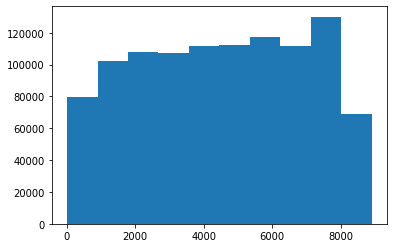

In [22]:
# Frame ID

plt.hist(df.Frame_ID)
plt.show()

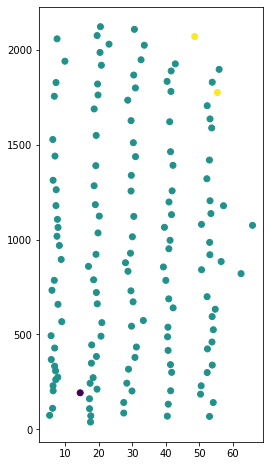

In [23]:
a_frame = df[df.Frame_ID == 7500]
plt.figure(figsize=(4,8))
plt.scatter(a_frame.Local_X,a_frame.Local_Y,c=a_frame.v_Class)
plt.show()

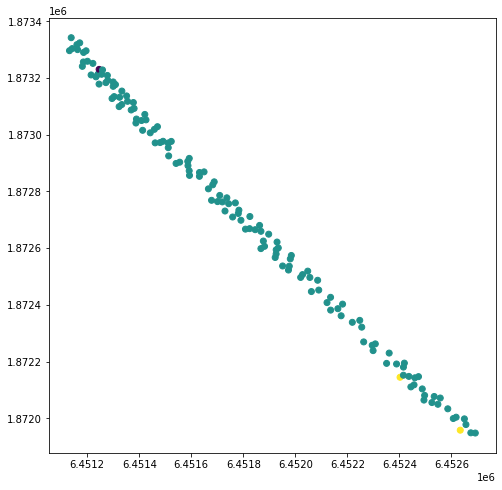

In [24]:
plt.figure(figsize=(8,8))
plt.scatter(a_frame.Global_X,a_frame.Global_Y,c=a_frame.v_Class)
plt.show()

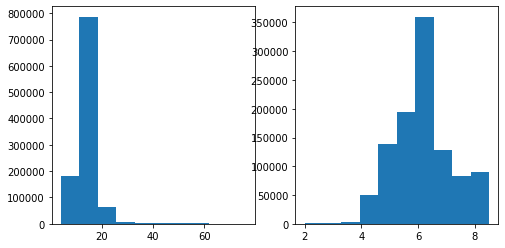

In [25]:
# v_length and v_width
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.hist(df.v_Length)
plt.subplot(1,2,2)
plt.hist(df.v_Width)
plt.show()

Most of the cars have length below 20 feet and width around 6 feet

In [32]:
# correlation matrix

import seaborn as sns

sns.pairplot(df.iloc[:1000,:], hue="v_Class")

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


Error in callback <function flush_figures at 0x7f65cb6c87b8> (for post_execute):


KeyboardInterrupt: ignored

# Animation

In [27]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [28]:
%pip install celluloid
from celluloid import Camera

In [29]:
first_frame_ID = df.Frame_ID.min()
print(first_frame_ID)
first_frame = df[df.Frame_ID == first_frame_ID]
first_frame

8


,Vehicle_ID,Frame_ID,Total_Frames,Global_Time,Local_X,Local_Y,Global_X,Global_Y,v_Length,v_Width,v_Class,v_Vel,v_Acc,Lane_ID,Preceeding,Following,Space_Hdwy,Time_Hdwy
788,5,8,452,1118846979700,39.788,39.153867,6451122.815,1873326.569,17.0,7.9,2,40.0,0.0,4,0,0,0.0,0.0


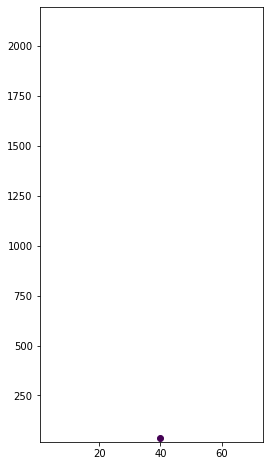

In [31]:
# Set frame
fig, ax = plt.subplots(figsize=(4, 8))
ax.set(xlim=(df.Local_X.min(), df.Local_X.max()), ylim=(df.Local_Y.min(), df.Local_Y.max()))

#frame = ax.scatter(first_frame.Local_X, first_frame.Local_Y, color='black', lw=4)

camera = Camera(fig)
# draw only first 400 frame 
for i in range(400):
    frame_data = df[df.Frame_ID == i+8]
    ax.scatter(frame_data.Local_X, frame_data.Local_Y,c=frame_data.v_Class)
    plt.pause(0.001)
    camera.snap()

animation = camera.animate()
#HTML(animation.to_html5_video())
HTML(animation.to_jshtml())